# Compare isnobal snow depth and SWE outputs against validation datasets
*J. Michelle Hu  
University of Utah  
April 2024*  
---

In [2]:
import sys
import xarray as xr
import numpy as np

from pathlib import PurePath
import pandas as pd
import hvplot.xarray
import rioxarray as riox
import matplotlib.pyplot as plt

sys.path.append('/uufs/chpc.utah.edu/common/home/u6058223/git_dirs/env/')

import helpers as h

/uufs/chpc.utah.edu/common/home/u6058223/software/pkg/miniconda3/envs/work/lib/python3.12/site-packages/pyproj/__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()


## Quick check on isnobal model outputs

In [4]:
yampadir='/uufs/chpc.utah.edu/common/home/skiles-group1/jmhu/test/yampa_isnobal/wy2020/yampa_basin/run20191001'

In [5]:
import pathlib as p

In [9]:
fns = h.fn_list(yampadir, '*nc')
# fns

In [10]:
fns

['/uufs/chpc.utah.edu/common/home/skiles-group1/jmhu/test/yampa_isnobal/wy2020/yampa_basin/run20191001/air_temp.nc',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/jmhu/test/yampa_isnobal/wy2020/yampa_basin/run20191001/albedo_ir.nc',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/jmhu/test/yampa_isnobal/wy2020/yampa_basin/run20191001/albedo_vis.nc',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/jmhu/test/yampa_isnobal/wy2020/yampa_basin/run20191001/cloud_factor.nc',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/jmhu/test/yampa_isnobal/wy2020/yampa_basin/run20191001/net_solar.nc',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/jmhu/test/yampa_isnobal/wy2020/yampa_basin/run20191001/percent_snow.nc',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/jmhu/test/yampa_isnobal/wy2020/yampa_basin/run20191001/precip.nc',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/jmhu/test/yampa_isnobal/wy2020/yampa_basin/run20191001/precip_temp.nc',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/jmh

## ASO snow depth

In [2]:
aso_dir = '/uufs/chpc.utah.edu/common/home/skiles-group1/ASO'

#### Plot a single day from Colorado ERW
Note that basin naming is not consistent across years  
Add handling to merge snow depth and SWE variables 

In [3]:
state = 'CO'
basin = 'East'

In [4]:
depth_fns = h.fn_list(aso_dir, f'{state}/*{basin}*/*snowdepth*tif')
swe_fns = h.fn_list(aso_dir, f'{state}/*{basin}*/*swe*tif')
swe_fns

['/uufs/chpc.utah.edu/common/home/skiles-group1/ASO/CO/ASO_EastRiver_2022May18_AllData_and_Reports/ASO_EastRiver_Mosaic_2022May18_swe_50m.tif',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/ASO/CO/ASO_EastRiver_2023Apr01_AllData_and_Reports/ASO_EastRiver_2023Apr01_swe_50m.tif',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/ASO/CO/ASO_EastRiver_2023May23_AllData_and_Reports/ASO_EastRiver_2023May23_swe_50m.tif',
 '/uufs/chpc.utah.edu/common/home/skiles-group1/ASO/CO/ASO_East_2024April03_AllData_and_Reports/ASO_EastRiver_2024Apr03_swe_50m.tif']

In [5]:
# ds = xr.open_dataset(depth_fns[0])
# ds

In [6]:
# ds_rename = ds.rename_vars({'band_data': 'snow_depth'})
# ds_rename

#### >> Consider merging depth and swe arrays later on as in SWANN?

In [7]:
# Load depth arrays and squeeze out single dimensions
depth_list = [np.squeeze(xr.open_dataset(fn)) for fn in depth_fns]

# Rename band_data to descriptive snow_depth
depth_list = [ds.rename_vars({'band_data': 'snow_depth'}) for ds in depth_list]

# Load swe arrays and squeeze out single dimensions
swe_list = [np.squeeze(xr.open_dataset(fn)) for fn in swe_fns]

# Rename band_data to descriptive swe
swe_list = [ds.rename_vars({'band_data': 'swe'}) for ds in swe_list]

#### Deal with adding time input for ASO data

In [8]:
def extract_dt(fn, inputvar="_snowdepth"):
    """Extract date from ASO snow depth or swe filename and store in corresponding DataSet
    Change inputvar to '_swe' if using SWE"""

    # get date from filename and store in dataset as a single dimension?
    dt_file = PurePath(fn).name.split(inputvar)[0].split("_")[-1]
    year = dt_file[:4]
    month = dt_file[4:-2]
    day = dt_file[-2:]
    # Create a dataframe from the parsed dates
    df = pd.DataFrame(columns=['Year', 'Month', 'Day'], 
                      data=np.expand_dims(np.array([year, month, day]), 1).T)
    
    # Create dictionary of month abbreviations with associated numeric 
    # from https://stackoverflow.com/questions/42684530/convert-a-column-in-a-python-pandas-from-string-month-into-int
    d = dict(zip(pd.date_range('2000-01-01', freq='ME', periods=12).strftime('%b'), range(1,13)))

    # Map numeric month using month abbreviation dictionary
    df.Month = df.Month.map(d)
    dt = pd.to_datetime(df)
    return dt

def assign_dt(ds, dt):
    """Assign date value to a new time dimension for input dataset"""
    ds = ds.expand_dims(time=dt)
    return ds

In [9]:
depth_list = [assign_dt(ds, extract_dt(fn)) for ds, fn in zip(depth_list, depth_fns)]
swe_list = [assign_dt(ds, extract_dt(fn, inputvar='_swe')) for ds, fn in zip(swe_list, swe_fns)]

In [10]:
# %%time
# # This approach uses the bottom plotting mechanism
# depth_list = xr.concat(depth_list, dim='time')
# swe_list = xr.concat(swe_list, dim='time')

In [14]:
depth_list[0]

<xarray.Dataset> Size: 3MB
Dimensions:      (time: 1, x: 809, y: 995)
Coordinates:
  * time         (time) datetime64[ns] 8B 2022-05-18
    band         int64 8B 1
  * x            (x) float64 6kB 3.081e+05 3.081e+05 ... 3.484e+05 3.485e+05
  * y            (y) float64 8kB 4.322e+06 4.322e+06 ... 4.273e+06 4.273e+06
    spatial_ref  int64 8B 0
Data variables:
    snow_depth   (time, y, x) float32 3MB nan nan nan nan ... nan nan nan nan

In [15]:
depth_list[0].hvplot(cmap="fire", invert=True, aspect='equal', clim=(0, 4))

:NdOverlay   [Element]
   :Histogram   [snow_depth]   (snow_depth_count)

In [26]:

depth_list[0].time.values



/scratch/local/u6058223/ipykernel_456/892626216.py:1: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  depth_list[0].time.values.tostring()


b'\x00\x00fi\xf2\t\xf0\x16'

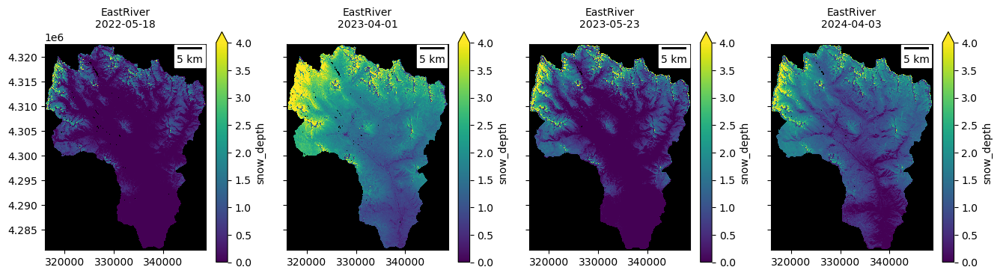

In [27]:
fig, ax = plt.subplots(1, 4, figsize=(16,4), sharex=True, sharey=True)

for jdx, arr in enumerate(depth_list):
    thisax = ax.flatten()[jdx]
    # format date for title string
    ts = pd.to_datetime(str(arr['snow_depth'][0].time.values)) 
    d = ts.strftime('%Y-%m-%d')
    
    h.plot_one(arr=arr['snow_depth'][0], 
               specify_ax=(fig, thisax), 
               turnofflabels=True, 
               title=f'{PurePath(depth_fns[jdx]).name.split("_")[1]}\n{d}',
               # title=f'{PurePath(depth_fns[jdx]).name.split("_snowdepth_")[0]}\n_snowdepth_\n{PurePath(depth_fns[jdx]).name.split("_snowdepth_")[1]}', 
               # title=f'{PurePath(depth_fns[jdx]).name}', 
               vmin=0, 
               vmax=4, 
               cbaron=True,
               setfc='k',
               cmap='viridis'
              )
    
# for jdx, dt in enumerate(depth_list['snow_depth'].time):
#     thisax = ax.flatten()[jdx]
#     # print(dt.values)
#     h.plot_one(arr=depth_list['snow_depth'].sel(time=dt.values), 
#                specify_ax=(fig, thisax), 
#                turnofflabels=True, 
#                title=None, 
#                vmin=0, 
#                vmax=4, 
#                cbaron=False,
#                setfc='k',
#                cmap='viridis'
#               )

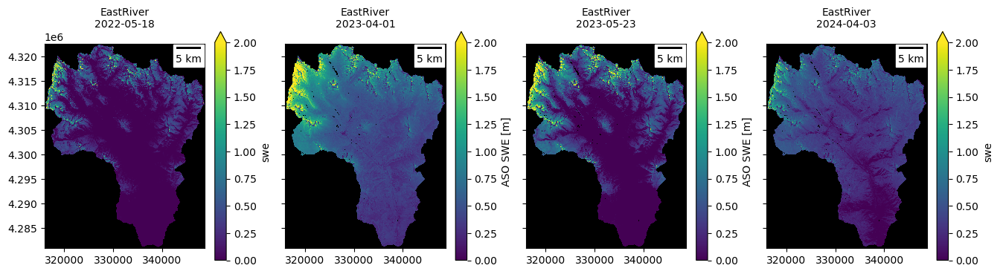

In [28]:
fig, ax = plt.subplots(1, 4, figsize=(16,4), sharex=True, sharey=True)

for jdx, arr in enumerate(swe_list):
    thisax = ax.flatten()[jdx]
    ts = pd.to_datetime(str(arr['swe'][0].time.values)) 
    d = ts.strftime('%Y-%m-%d')
    h.plot_one(arr=arr['swe'][0], 
               specify_ax=(fig, thisax), 
               turnofflabels=True, 
               title=f'{PurePath(swe_fns[jdx]).name.split("_")[1]}\n{d}',
               vmin=0, 
               vmax=2, 
               cbaron=True,
               setfc='k',
               cmap='viridis'
              )

# Pick up next time
- Plot SWANN products
- Plot model outputs
- Plot comparisons and examine Joe's Comparison notebooks

## SWANN (University of Arizona)

In [18]:
swann_dir = '/uufs/chpc.utah.edu/common/home/skiles-group1/SWANN_SWE_depth'

#### Plot a single year of SWANN

In [19]:
swann_fns = h.fn_list(swann_dir, "*.nc")

In [20]:
swann_fns[0]

'/uufs/chpc.utah.edu/common/home/skiles-group1/SWANN_SWE_depth/4km_SWE_Depth_WY1982_v01.nc'

In [21]:
ds = xr.open_dataset(swann_fns[0])
ds

<xarray.Dataset> Size: 3GB
Dimensions:   (lat: 621, lon: 1405, time: 365, time_str_len: 11)
Coordinates:
  * lat       (lat) float32 2kB 24.08 24.12 24.17 24.21 ... 49.83 49.88 49.92
  * lon       (lon) float32 6kB -125.0 -125.0 -124.9 ... -66.58 -66.54 -66.5
  * time      (time) datetime64[ns] 3kB 1981-10-01 1981-10-02 ... 1982-09-30
Dimensions without coordinates: time_str_len
Data variables:
    crs       |S1 1B ...
    time_str  (time_str_len, time) |S1 4kB ...
    SWE       (time, lat, lon) float32 1GB ...
    DEPTH     (time, lat, lon) float32 1GB ...

In [22]:
swann_list = [xr.open_dataset(fn) for fn in swann_fns]

In [23]:
swann_list[0].DEPTH.time

<xarray.DataArray 'time' (time: 365)> Size: 3kB
array(['1981-10-01T00:00:00.000000000', '1981-10-02T00:00:00.000000000',
       '1981-10-03T00:00:00.000000000', ..., '1982-09-28T00:00:00.000000000',
       '1982-09-29T00:00:00.000000000', '1982-09-30T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 3kB 1981-10-01 1981-10-02 ... 1982-09-30
Attributes:
    long_name:  time

In [24]:
ts = pd.to_datetime(str(swann_list[0].DEPTH[100, :, :].time.values)) 
d = ts.strftime('%Y-%m-%d')
d

'1982-01-09'

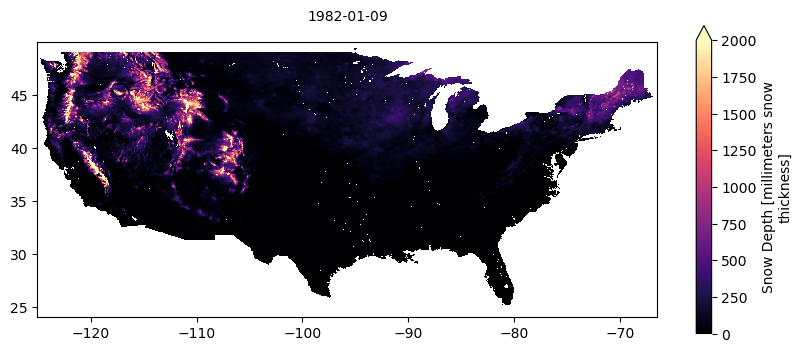

In [25]:
jdx = 100
ts = pd.to_datetime(str(swann_list[0].DEPTH[jdx, :, :].time.values)) 
d = ts.strftime('%Y-%m-%d')

h.plot_one(arr=swann_list[0].DEPTH[jdx, :, :], 
           # specify_ax=(fig, thisax), 
           turnofflabels=True, 
           title=d, 
           vmin=0, 
           vmax=2000, 
           # cbaron=False,
           scale=None,
           figsize=(10, 4)
          )

In [27]:
swann_list[0].DEPTH.isel(time=jdx).hvplot(cmap="fire", aspect='equal')

:Image   [lon,lat]   (DEPTH)

# Section out the area you're interested in
and specify this before you even read it in

In [29]:
dsx = riox.open_rasterio(depth_fns[0])[0]

In [30]:
dsx

<xarray.DataArray (y: 995, x: 809)> Size: 3MB
[804955 values with dtype=float32]
Coordinates:
    band         int64 8B 1
  * x            (x) float64 6kB 3.081e+05 3.081e+05 ... 3.484e+05 3.485e+05
  * y            (y) float64 8kB 4.322e+06 4.322e+06 ... 4.273e+06 4.273e+06
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:        Area
    TIFFTAG_XRESOLUTION:  1
    TIFFTAG_YRESOLUTION:  1
    _FillValue:           nan
    scale_factor:         1.0
    add_offset:           0.0

In [31]:
dsx.hvplot(cmap="fire", invert=True, aspect='equal', clim=(0, 4))

:Image   [y,x]   (value)

In [32]:
minlat = 38.663314
maxlat = 39.03354
minlon = -107.126393
maxlon = -106.739009

cropped_ds = swann_list[0].sel(lat=slice(minlat,maxlat), lon=slice(minlon, maxlon))

In [33]:
cropped_ds

<xarray.Dataset> Size: 270kB
Dimensions:   (lat: 9, lon: 10, time: 365, time_str_len: 11)
Coordinates:
  * lat       (lat) float32 36B 38.67 38.71 38.75 38.79 ... 38.92 38.96 39.0
  * lon       (lon) float32 40B -107.1 -107.1 -107.0 ... -106.8 -106.8 -106.8
  * time      (time) datetime64[ns] 3kB 1981-10-01 1981-10-02 ... 1982-09-30
Dimensions without coordinates: time_str_len
Data variables:
    crs       |S1 1B ...
    time_str  (time_str_len, time) |S1 4kB ...
    SWE       (time, lat, lon) float32 131kB ...
    DEPTH     (time, lat, lon) float32 131kB ...

In [34]:
cropped_ds.DEPTH.isel(time=jdx).hvplot(cmap="fire", aspect='equal')

:Image   [lon,lat]   (DEPTH)

### Can you crop by a pre-existing dataset?
Gonna need to deal with (likely) pyproj issues

In [ ]:
# try just with rioxarray

In [ ]:
Convert this to a standary numpy datetime

In [37]:
depth_list[0]

<xarray.Dataset> Size: 3MB
Dimensions:      (x: 809, y: 995)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 6kB 3.081e+05 3.081e+05 ... 3.484e+05 3.485e+05
  * y            (y) float64 8kB 4.322e+06 4.322e+06 ... 4.273e+06 4.273e+06
    spatial_ref  int64 8B 0
Data variables:
    snow_depth   (y, x) float32 3MB nan nan nan nan nan ... nan nan nan nan nan

In [36]:
ds

<xarray.Dataset> Size: 3GB
Dimensions:   (lat: 621, lon: 1405, time: 365, time_str_len: 11)
Coordinates:
  * lat       (lat) float32 2kB 24.08 24.12 24.17 24.21 ... 49.83 49.88 49.92
  * lon       (lon) float32 6kB -125.0 -125.0 -124.9 ... -66.58 -66.54 -66.5
  * time      (time) datetime64[ns] 3kB 1981-10-01 1981-10-02 ... 1982-09-30
Dimensions without coordinates: time_str_len
Data variables:
    crs       |S1 1B ...
    time_str  (time_str_len, time) |S1 4kB ...
    SWE       (time, lat, lon) float32 1GB ...
    DEPTH     (time, lat, lon) float32 1GB ...